# `popmon` introductory notebook

This notebook contains examples of how to generate `popmon` reports from a pandas DataFrame.

In [1]:
# (optional) Adjust the jupyter notebook style for easier navigation of the reports
from IPython.core.display import display, HTML

# Wider notebook
display(HTML("<style>.container { width:80% !important; }</style>"))
# Cells are higher by default
display(HTML("<style>div.output_scroll { height: 44em; }</style>"))

## Setup `popmon` and load our dataset

Install popmon (if not installed yet) in the current environment.

In [ ]:
import sys
!"{sys.executable}" -m pip install -q popmon

Import pandas and popmon, load and example dataset provided by popmon and show the first few results.

In [2]:
import pandas as pd
import popmon
from popmon import resources

In [3]:
df = pd.read_csv(resources.data("test.csv.gz"), parse_dates=["date"])

In [4]:
df.head()

,_id,address,age,balance,company,email,eyeColor,favoriteFruit,gender,guid,...,isActive,latitude,longitude,name,phone,registered,tags,transaction,currency,date
0,565ebe61ffa6f757b5029f29,"109 Monument Walk, Vicksburg, California, 6247",16,"$1,333.24",DOGSPA,tamekajoyce@dogspa.com,grey,banana,female,c06a96e4-31e2-426e-aa5a-51e3c71991aa,...,False,18.821230,-131.721235,Tameka Joyce,+1 (914) 553-2622,2015-05-02T07:39:52 -02:00,"['anim', 'eu', 'proident', 'duis', 'et', 'sit'...",1131.03,DOL,2015-05-02 07:39:52
1,565ebe616e073b23430d7052,"602 Harkness Avenue, Tyhee, Arizona, 5853",57,"$3,777.44",APPLICA,rosettaflynn@applica.com,brown,banana,female,6bbcaf11-a6b9-4f00-9db1-84fc11161526,...,True,-82.134610,52.720886,Rosetta Flynn,+1 (984) 525-3783,2015-06-16T08:08:53 -02:00,"['in', 'non', 'exercitation', 'dolor', 'aliqui...",-896.55,DOL,2015-06-16 08:08:53
2,565ebe6141fdb23a67dd7584,"286 Fay Court, Forbestown, Pennsylvania, 6141",26,"$1,248.97",HOMETOWN,kathiemurray@hometown.com,blue,strawberry,female,b85ef702-39f4-42dd-a87f-ce97864c3551,...,True,62.383017,-85.223346,Kathie Murray,+1 (859) 442-2358,2015-10-26T07:34:56 -01:00,"['culpa', 'sint', 'Lorem', 'culpa', 'veniam', ...",1224.04,DOL,2015-10-26 07:34:56
3,565ebe61c33636f6df907b06,"617 Baycliff Terrace, Castleton, Oklahoma, 7714",63,"$1,049.77",ISIS,bennetthahn@isis.com,green,strawberry,male,b42f1df9-839f-4f39-b3de-7ea3ac177786,...,True,-26.913326,-67.825793,Bennett Hahn,+1 (894) 564-2079,2015-06-04T01:59:25 -02:00,"['et', 'cillum', 'cillum', 'ad', 'laborum', 'c...",541.08,DOL,2015-06-04 01:59:25
4,565ebe61225511fd3288bb63,"262 Scholes Street, Fillmore, Utah, 2905",74,"$2,942.64",FUTURITY,cottoncarson@futurity.com,red,strawberry,male,14e518aa-2701-4397-94e7-72b9c27655ad,...,False,-2.777228,155.341981,Cotton Carson,+1 (825) 597-2328,2015-03-25T10:09:35 -01:00,"['labore', 'ea', 'officia', 'aliquip', 'nostru...",-372.62,DOL,2015-03-25 10:09:35


## Reporting given a pandas.DataFrame

In [5]:
report = df.pm_stability_report(
    # Use the 'date' column as our time axis
    time_axis="date",
    # Create batches for every two weeks of data
    time_width="2w",
    # Select a subset of features
    features=["date:age", "date:isActive", "date:eyeColor"],
)

C:\Users\mkars\anaconda3\lib\site-packages\histogrammar\dfinterface\make_histograms.py:171: UserWarning: time-axis "date" already found in binning specifications. not overwriting.
  warnings.warn(
2022-02-17 10:15:57,901 INFO [histogram_filler_base]: Filling 3 specified histograms. auto-binning.
100%|█████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  3.75it/s]
2022-02-17 10:15:58,704 INFO [hist_splitter]: Splitting histograms "hists" as "split_hists"
2022-02-17 10:15:58,735 INFO [hist_comparer]: Comparing "split_hists" with rolling sum of 1 previous histogram(s).
2022-02-17 10:16:02,032 INFO [hist_comparer]: Comparing "split_hists" with reference "split_hists"
2022-02-17 10:16:03,318 INFO [pull_calculator]: Comparing "comparisons" with median/mad of reference "comparisons"
2022-02-17 10:16:03,545 INFO [hist_profiler]: Profiling histograms "split_hists" as "profiles"
2022-02-17 10:16:03,587 INFO [pull_calculator]: Comparing "profiles" with median/mad o


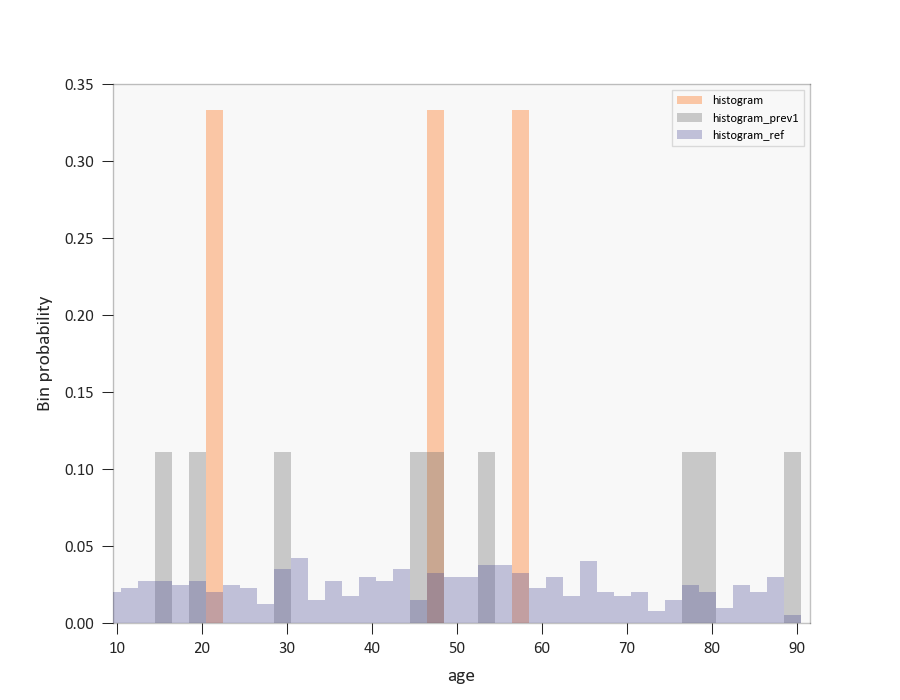
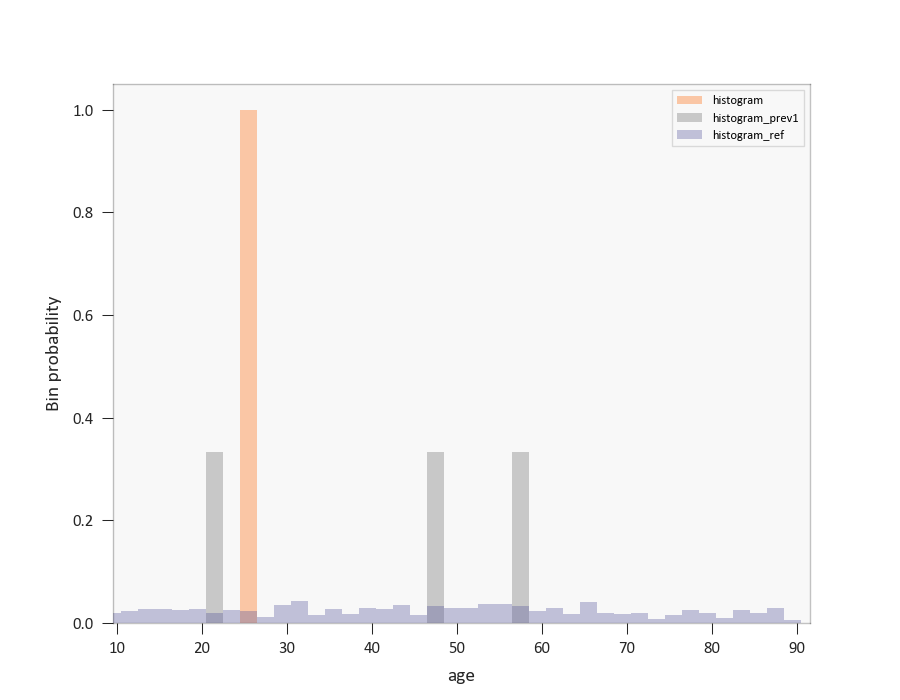
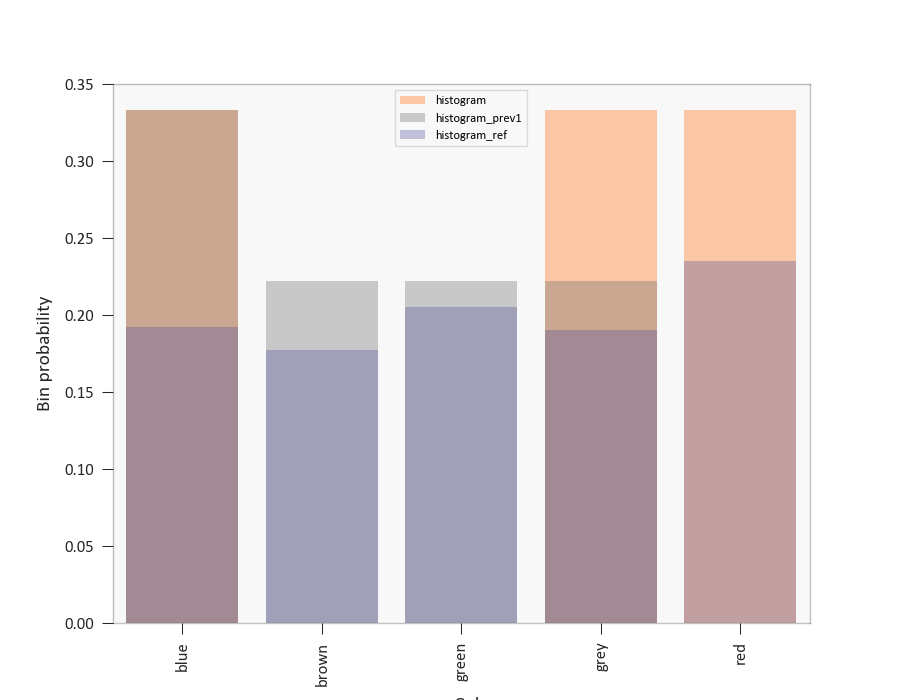
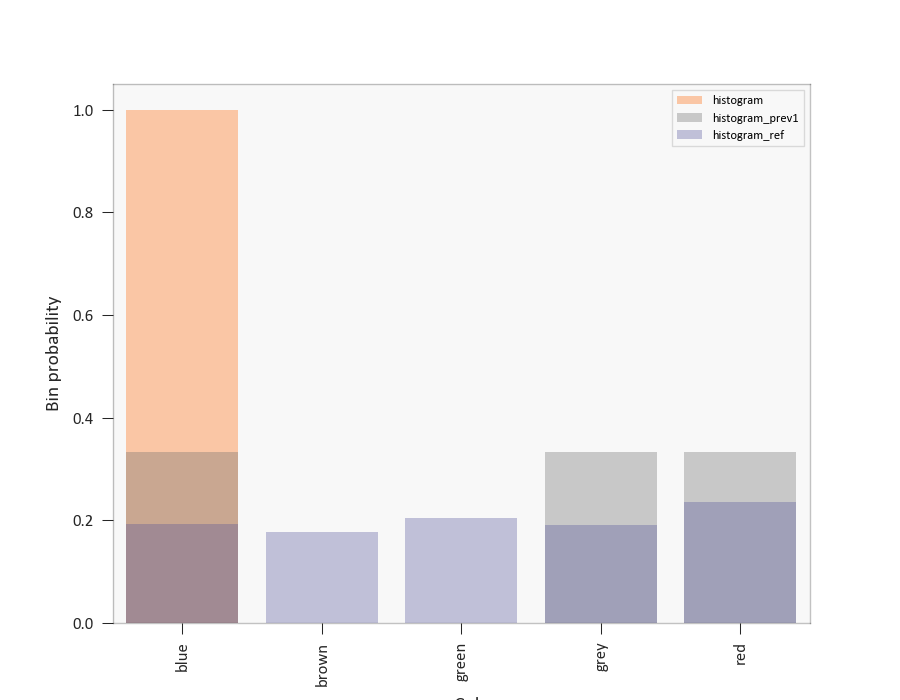
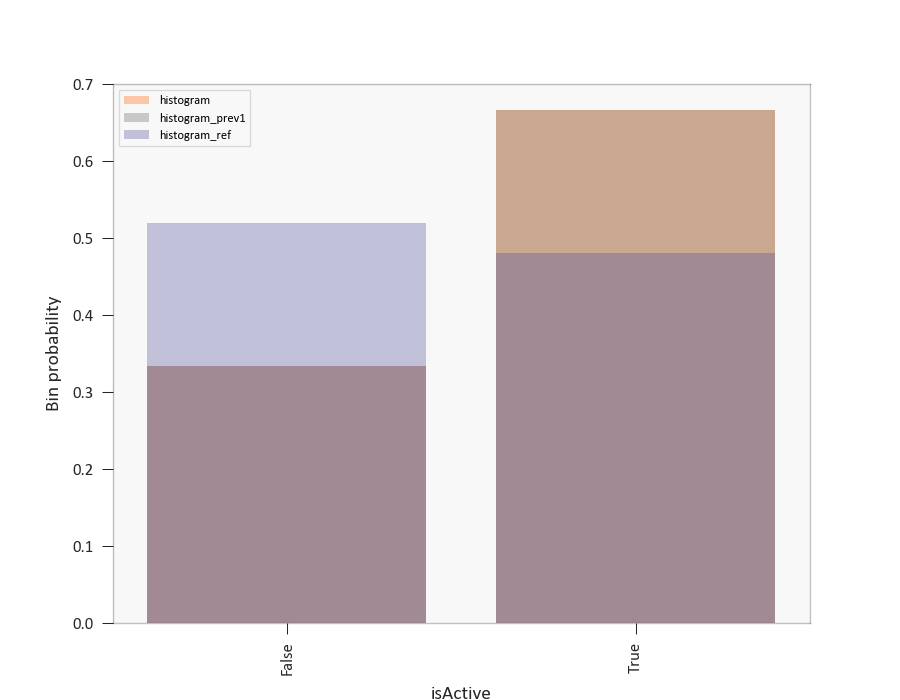
...
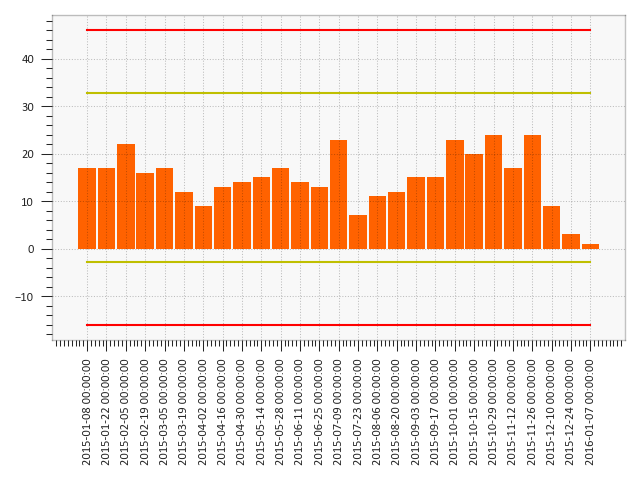
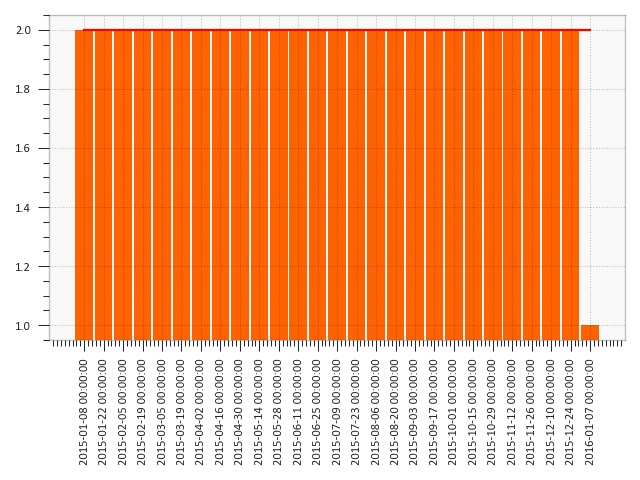
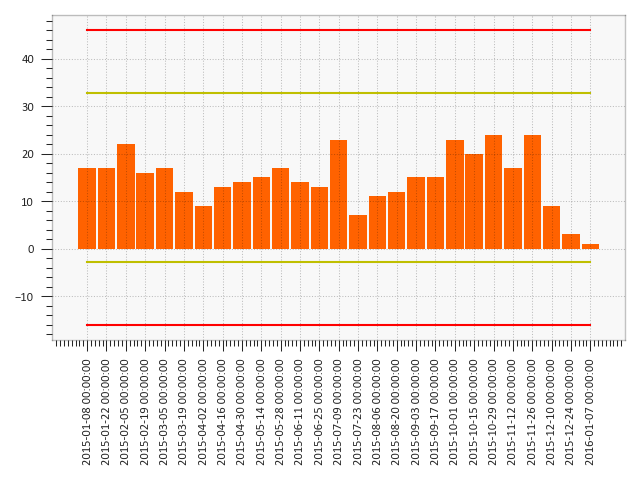
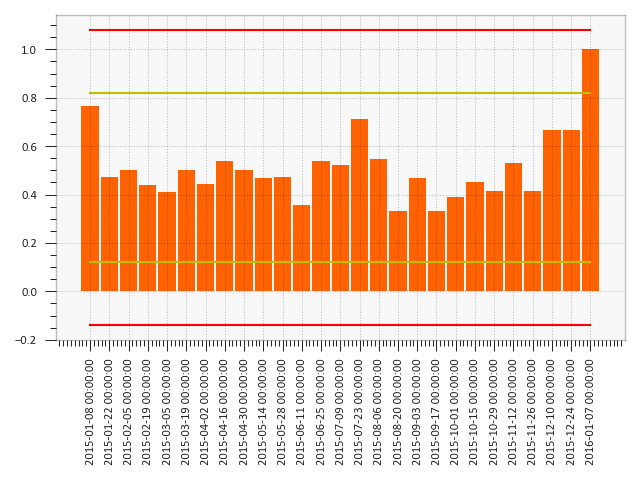
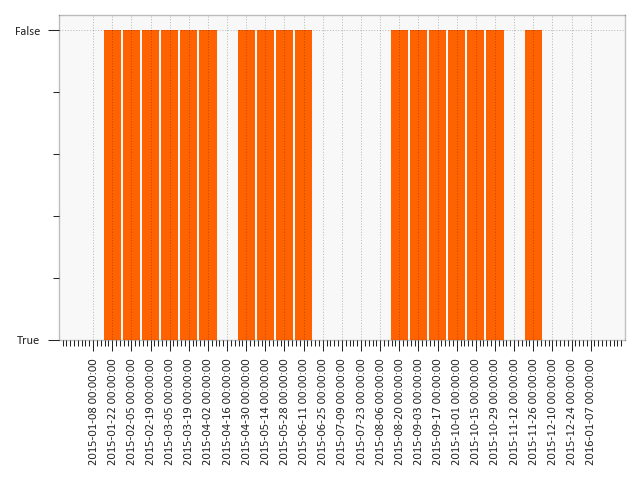

In [6]:
report

### Regenerate the report
You can change the report parameters without having to rerun the computational part of the pipeline using the `regenerate` method. For example: a short (limited) report will be generated since `extended_report` flag is set to `False`. If a user wants to configure which statistics she/he wants to see, `show_stats` argument has to be set accordingly.

Another option is to change the `plot_hist_n` parameter to control the number of histograms being displayed per feature.

2022-02-17 10:18:10,703 INFO [report_pipelines]: Generating report "html_report".
2022-02-17 10:18:10,711 INFO [histogram_section]: Generating section "Histograms".
100%|█████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  5.37it/s]
2022-02-17 10:18:11,282 INFO [traffic_light_section_generator]: Generating section "Traffic Lights". skip empty plots: True
100%|████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 370.96it/s]
2022-02-17 10:18:11,305 INFO [alert_section_generator]: Generating section "Alerts". skip empty plots: True
100%|████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 399.92it/s]
2022-02-17 10:18:11,353 INFO [section_generator]: Generating section "Comparisons". skip empty plots: True
100%|█████████████████████████████████████████████████████████████████| 3/3 [00:04<00:00,  1.37s/it]
2022-02-17 10:18:15,530 INFO [section_generator]: Generating section "Profiles". skip empty 


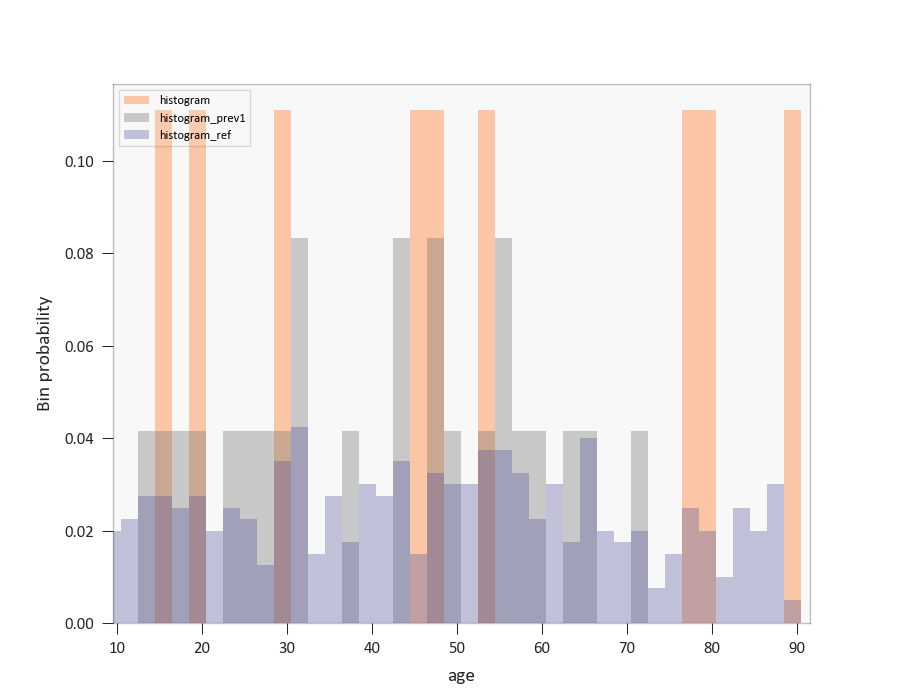
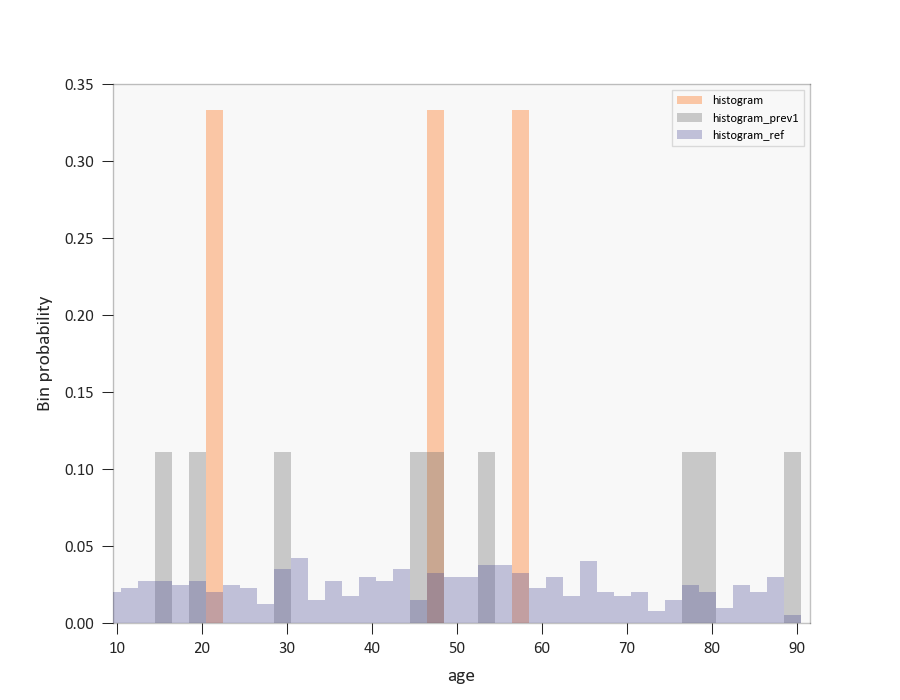
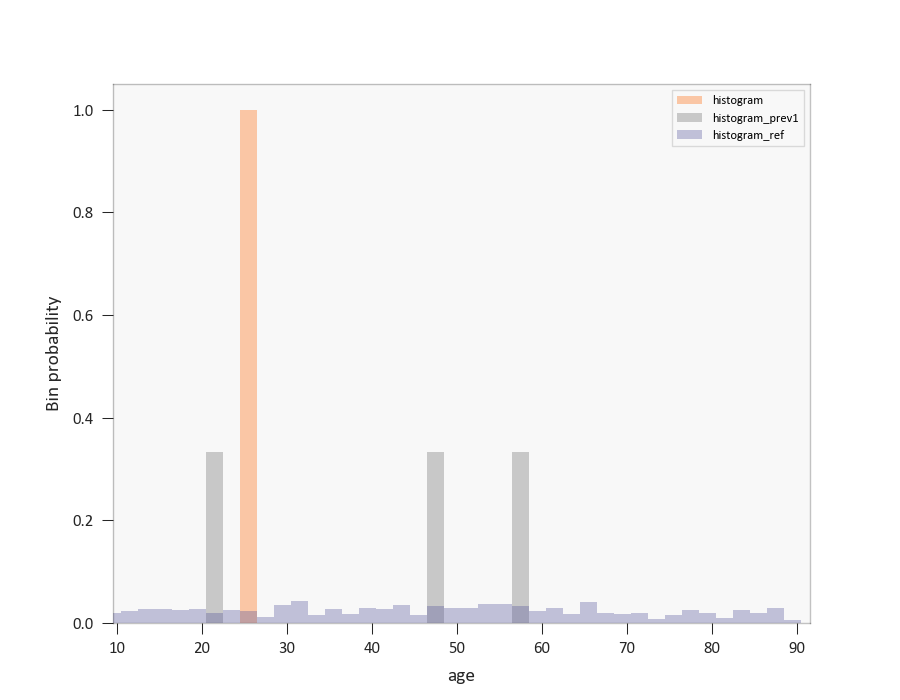
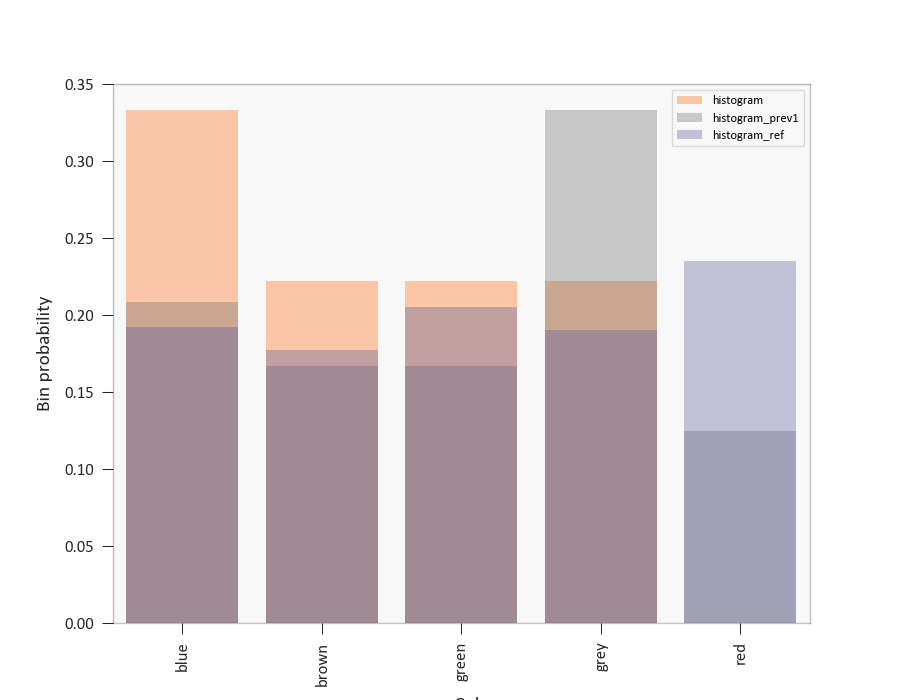
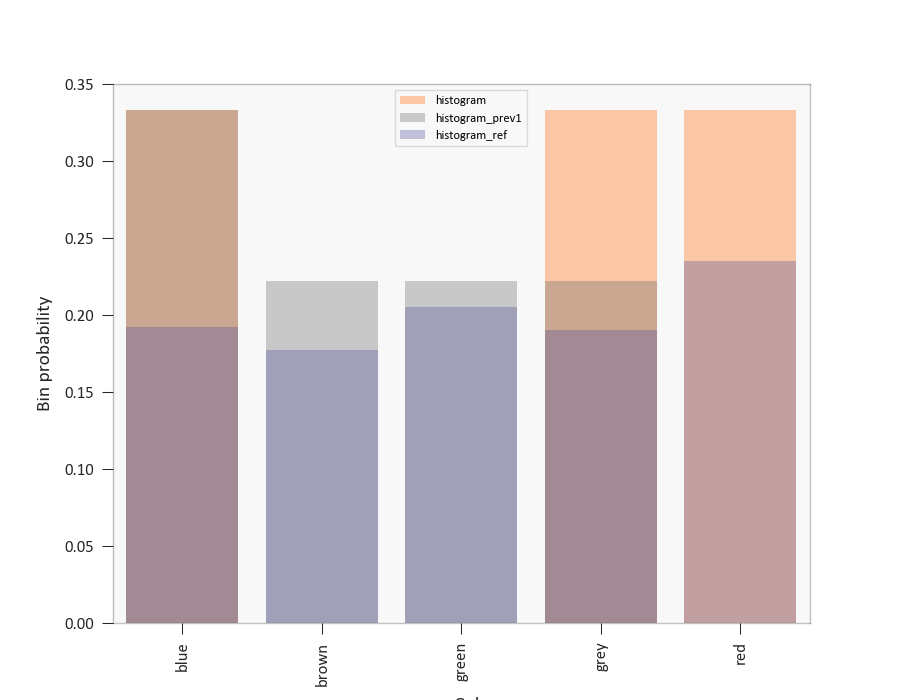
...
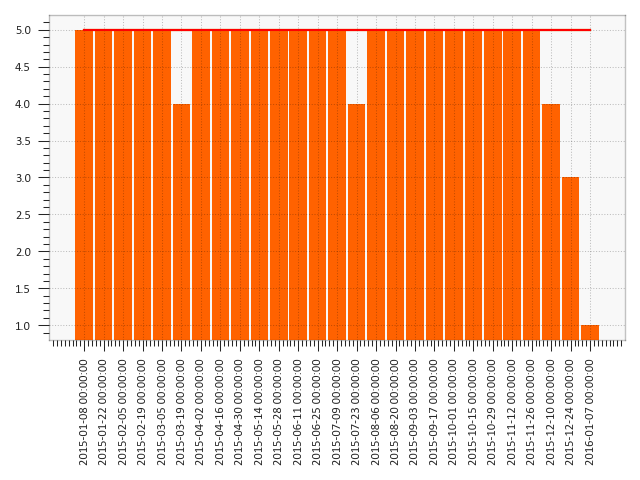
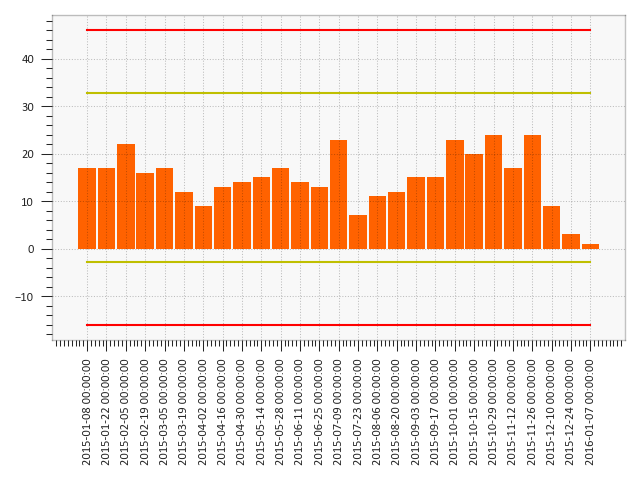
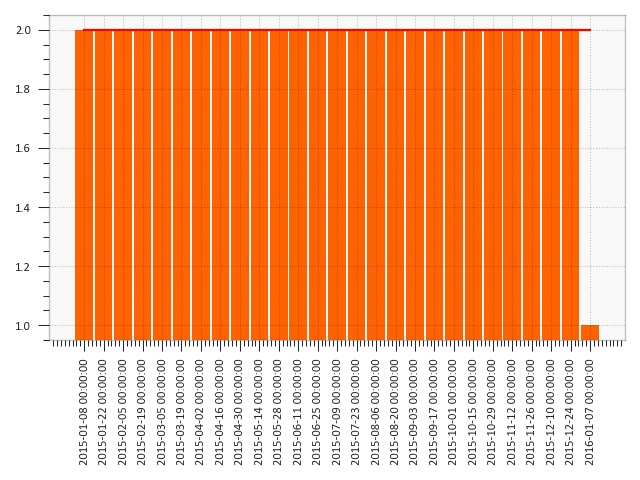
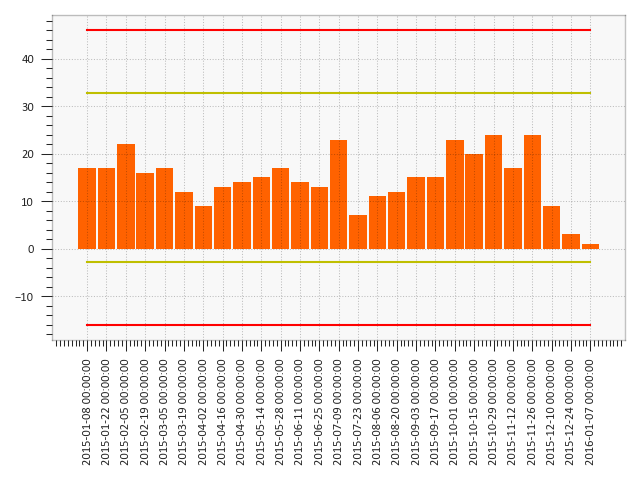
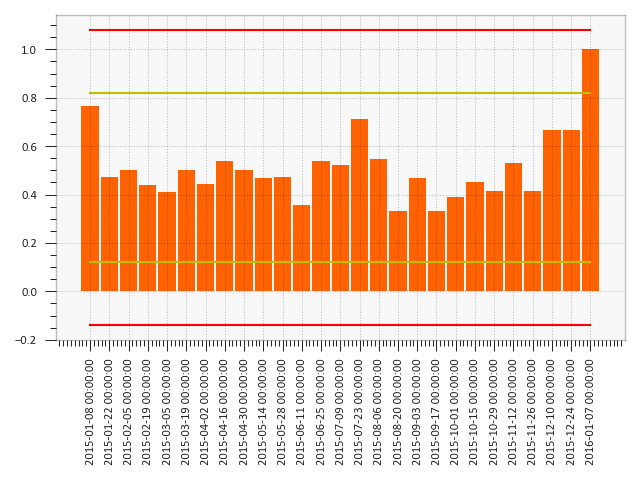

In [7]:
report.regenerate(extended_report=False, plot_hist_n=3)

## Reporting given a histograms

If the user would like to generate the report directly from histograms, then popmon also supports that.
First, we generate histograms, (but we could load pre-generated histograms from a pickle or json file as well)

In [8]:
hists = df.pm_make_histograms(
    time_axis="date",
    time_width="2w",
    features=["date:age", "date:gender", "date:isActive"],
)

2022-02-17 10:18:38,408 INFO [histogram_filler_base]: Filling 3 specified histograms. auto-binning.
100%|█████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 45.49it/s]


In [9]:
list(hists.keys())

['date:age', 'date:gender', 'date:isActive']

And then generate the report based on histograms:

In [10]:
report = popmon.stability_report(hists)

2022-02-17 10:18:56,019 INFO [hist_splitter]: Splitting histograms "hists" as "split_hists"
2022-02-17 10:18:56,054 INFO [hist_comparer]: Comparing "split_hists" with rolling sum of 1 previous histogram(s).
2022-02-17 10:18:56,234 INFO [hist_comparer]: Comparing "split_hists" with reference "split_hists"
2022-02-17 10:18:56,376 INFO [pull_calculator]: Comparing "comparisons" with median/mad of reference "comparisons"
2022-02-17 10:18:56,604 INFO [hist_profiler]: Profiling histograms "split_hists" as "profiles"
2022-02-17 10:18:56,645 INFO [pull_calculator]: Comparing "profiles" with median/mad of reference "profiles"
2022-02-17 10:18:57,119 INFO [apply_func]: Computing significance of (rolling) trend in means of features
2022-02-17 10:18:57,166 INFO [compute_tl_bounds]: Calculating static bounds for "profiles"
2022-02-17 10:18:57,310 INFO [compute_tl_bounds]: Calculating static bounds for "comparisons"
2022-02-17 10:18:57,397 INFO [compute_tl_bounds]: Calculating traffic light alerts f


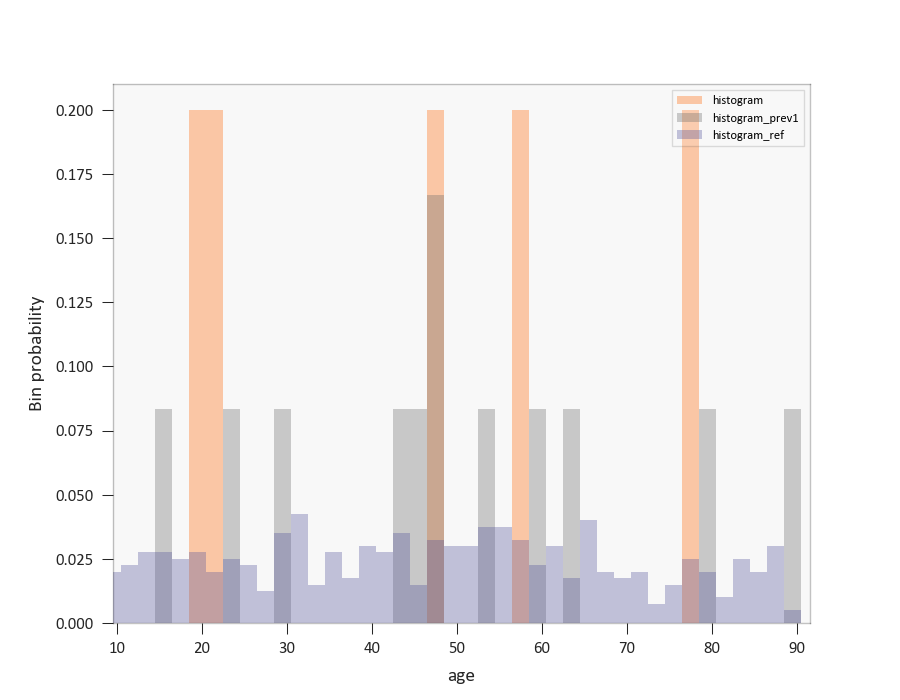
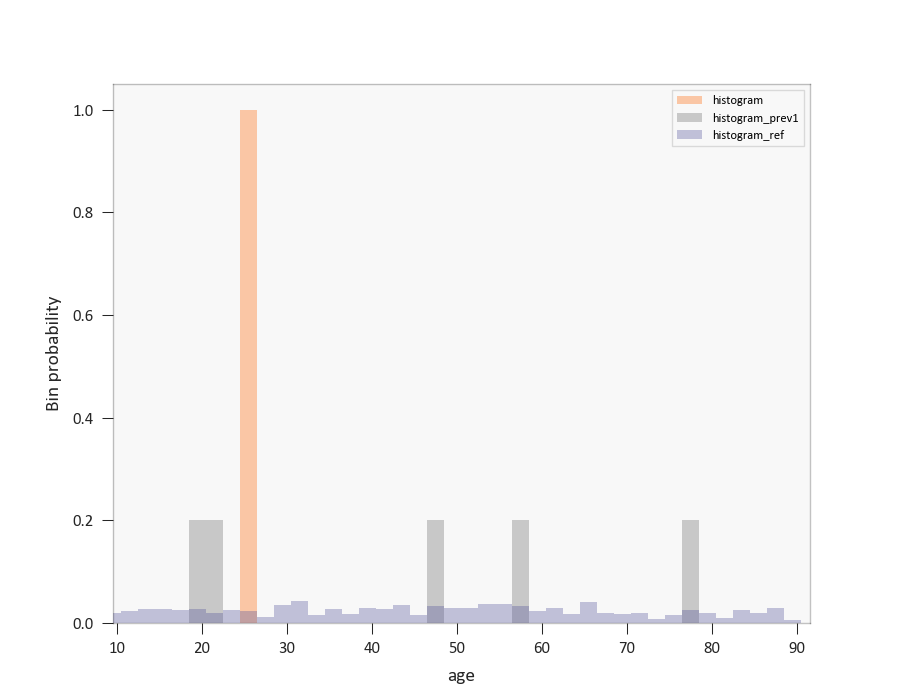
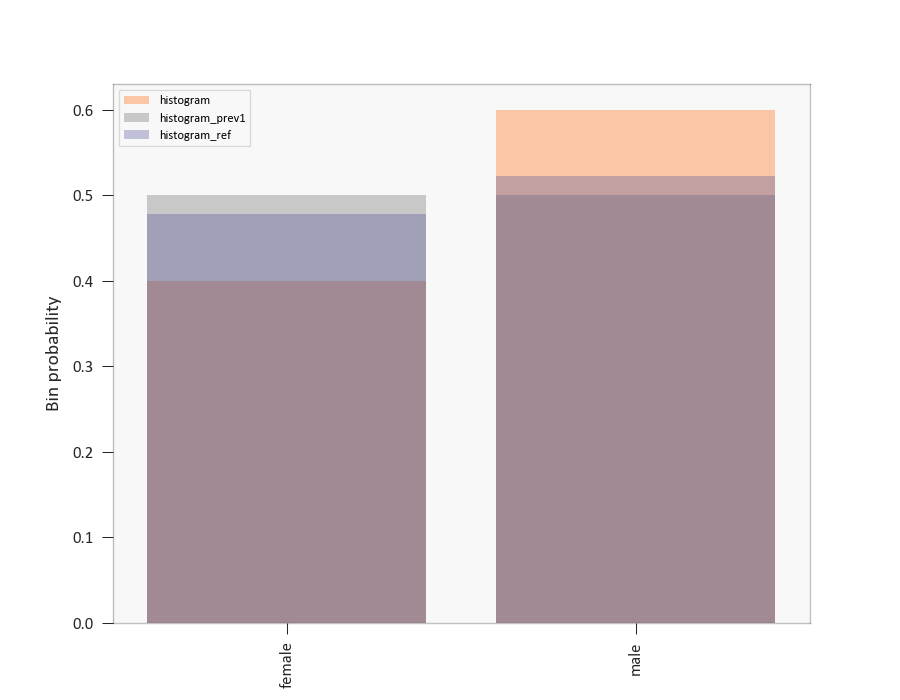
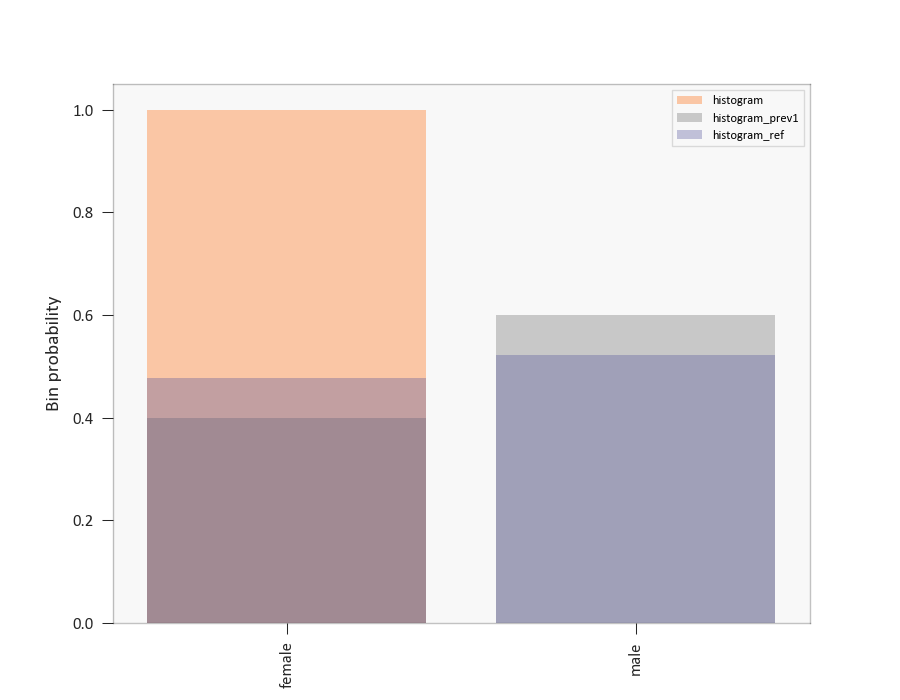
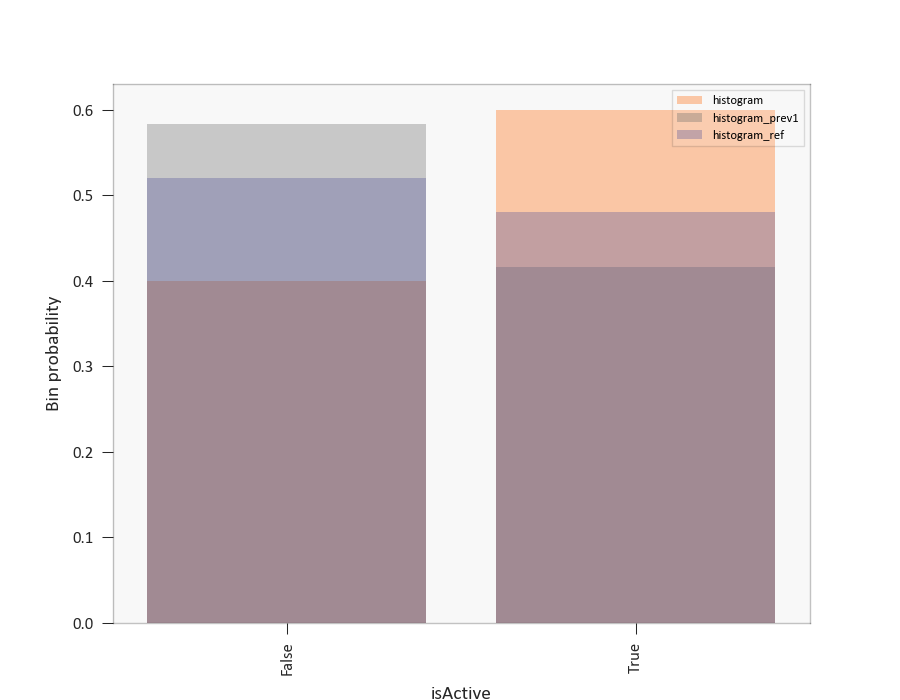
...
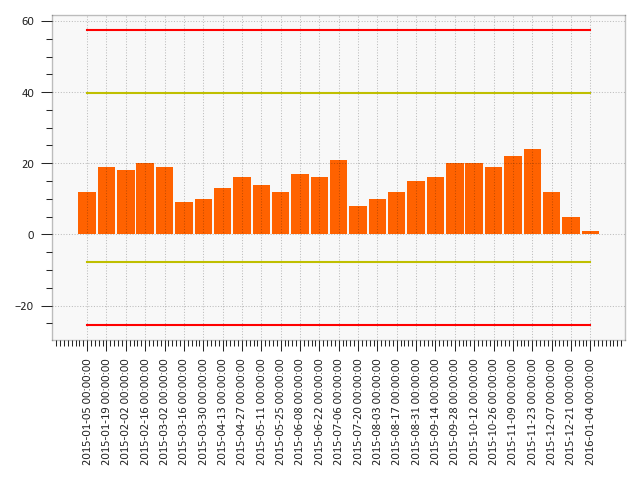
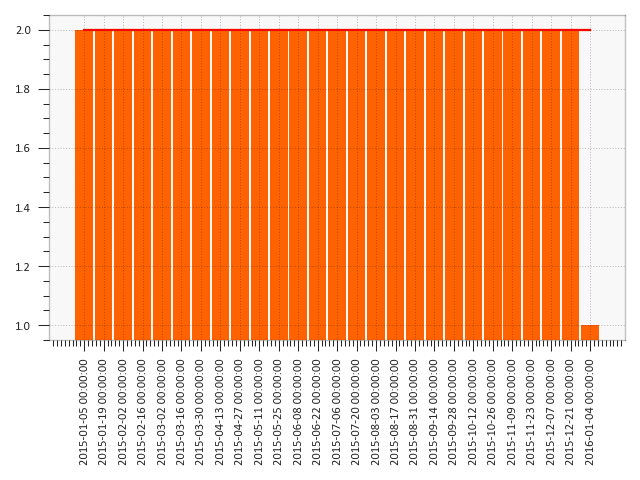
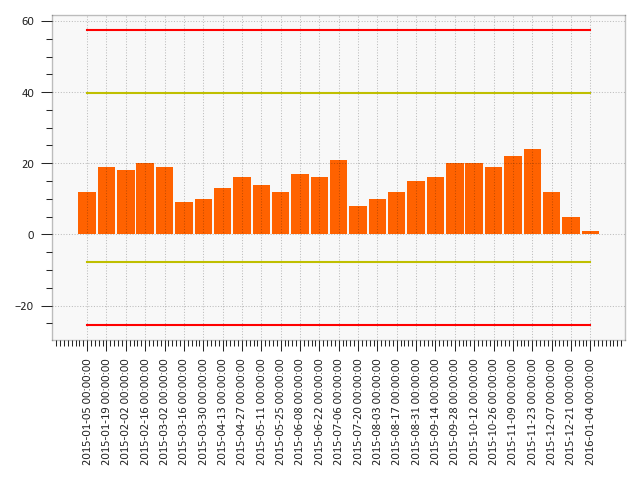
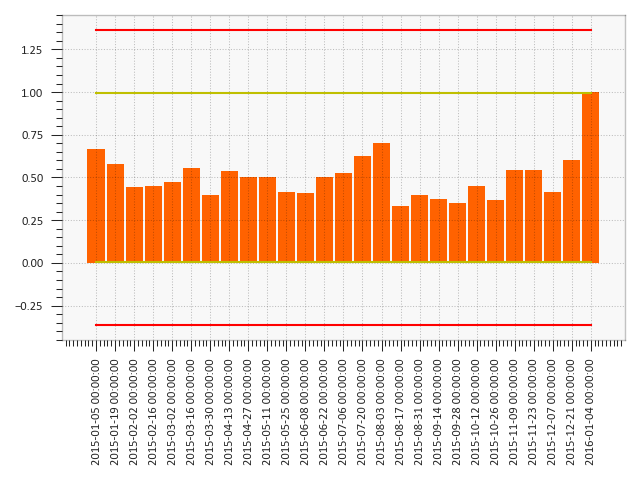
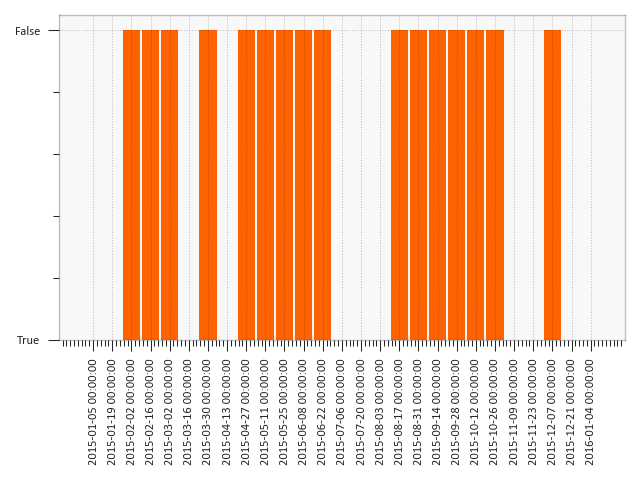

In [11]:
report